<a href="https://colab.research.google.com/github/MSIMulti/AIFFEL_quest_cr/blob/master/MainQuest/Quest03/CV_Proj_Vision_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# 라이브러리 불러오기
!pip3 install tensorflow-estimator==2.6.0

In [ ]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

In [ ]:
# 이미지 시각화 함수 만들기
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

In [ ]:
# 이미지 리사이징 함수 만들기
def download_and_resize_image(url, new_width=256, new_height=256, display=False):

  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 읽기
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.LANCZOS) # 이미지 조정 ※AttributeError로 인해, Image.ANTIALIAS를 Image.LANCZOS로 수정함
  pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

In [ ]:
# 바운딩 박스 함수 만들기
def draw_bounding_box_on_image(image,
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):

  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

# BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getbbox(ds)[3] - font.getbbox(ds)[1] for ds in display_str_list] # attribute 'getsize'로 인해, [font.getsize(ds)[1] for ds in display_str_list]를 [font.getbbox(ds)[3] - font.getbbox(ds)[1] for ds in display_str_list]로 수정함

  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height

  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getbbox(display_str)[2:4] # attribute 'getsize'로 인해, font.getsize(display_str)를 font.getbbox(display_str)[2:4]로 수정함
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

In [ ]:
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

In [ ]:
# [오류 발생] 불러온 이미지의 크기 변경
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

AttributeError: module 'PIL.Image' has no attribute 'ANTIALIAS'

# AttributeError가 발생하는 이유
Image.ANTIALIAS는 Pillow 구버전에서 사용되던 필터로 고품질 이미지 리사이징을 제공하기 위해 사용되었는데, Pillow 신버전에서는 더 이상 사용되지 않게 되어 Image.LANCZOS로 변경하여 사용해야 합니다.

Image downloaded to /tmp/tmpr43wb2eb.jpg.


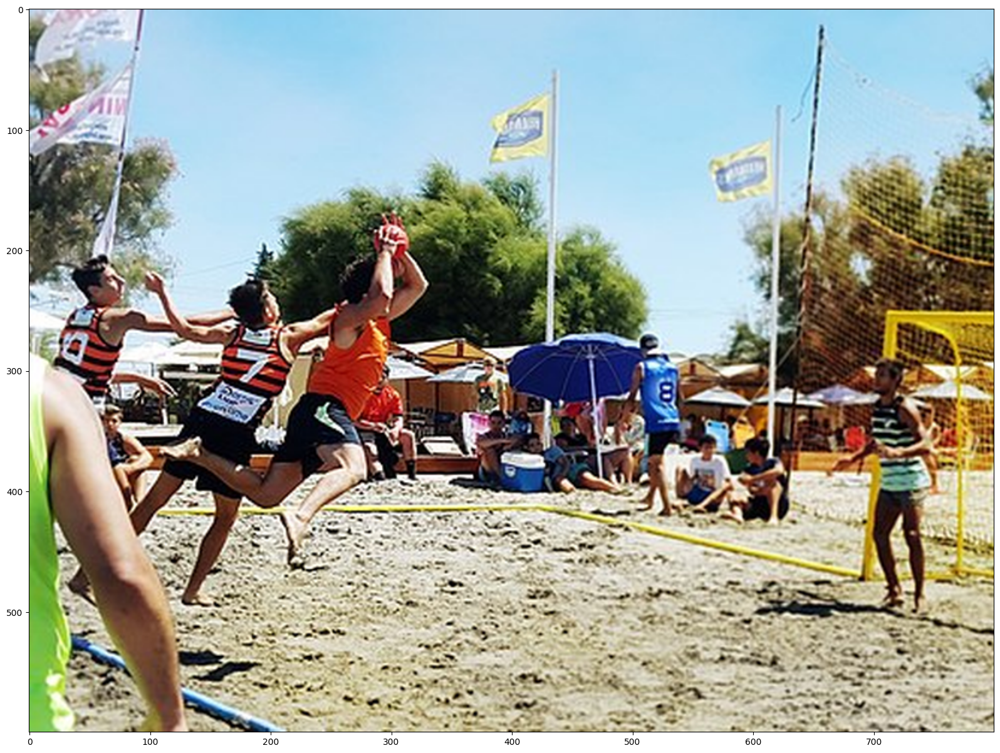

In [ ]:
# 불러온 이미지의 크기 변경
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 800, 600, True)  # new_width와 new_height를 변경해 보세요.

In [ ]:
# Faster RCNN 모델 불러오기
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

In [ ]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [ ]:
# Detector 함수 만들기
def run_detector(detector, path):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

In [ ]:
# [오류 발생] Detector 실행
run_detector(detector, downloaded_image_path)

Found 100 objects.
Inference time:  89.47773933410645


AttributeError: 'FreeTypeFont' object has no attribute 'getsize'

# getsize 오류가 발생하는 이유
Pillow 구버전에서 텍스트 크기를 얻는데 getsize()가 사용되었지만, 신버전에서는 getbbox() 사용합니다.

Found 100 objects.
Inference time:  35.2588849067688


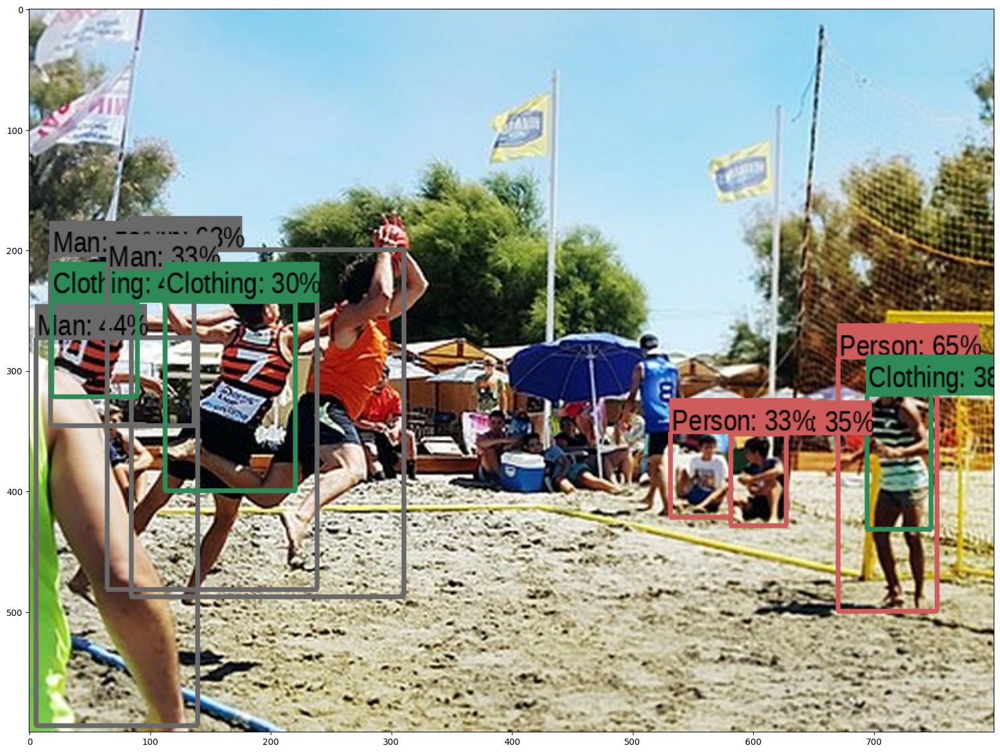

In [ ]:
# Detector 실행
run_detector(detector, downloaded_image_path)

In [ ]:
# 이미지 불러오기
image_url = "https://weconsumer.or.kr/upload/editor/1620809883_8dC_EC82ACECA7841-1.jpg"

In [ ]:
downloaded_image_path = download_and_resize_image(image_url, 800, 600, True)  # 새로운 크기 지정

run_detector(detector, downloaded_image_path)

Image downloaded to /tmp/tmp04to2mgu.jpg.
Found 100 objects.
Inference time:  32.03790307044983


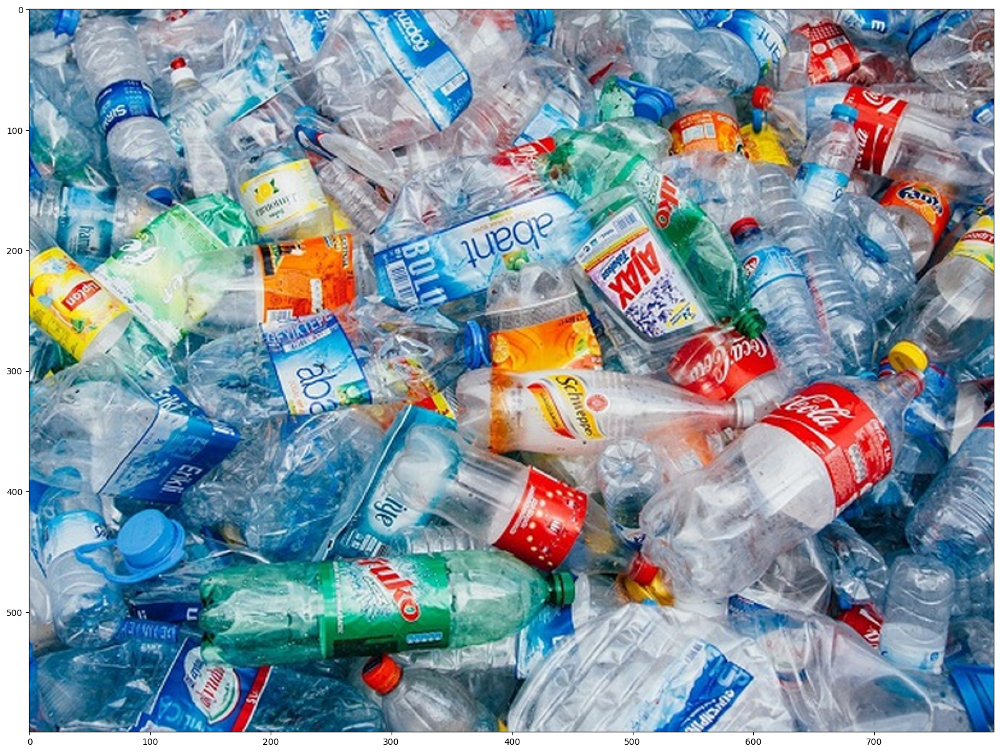

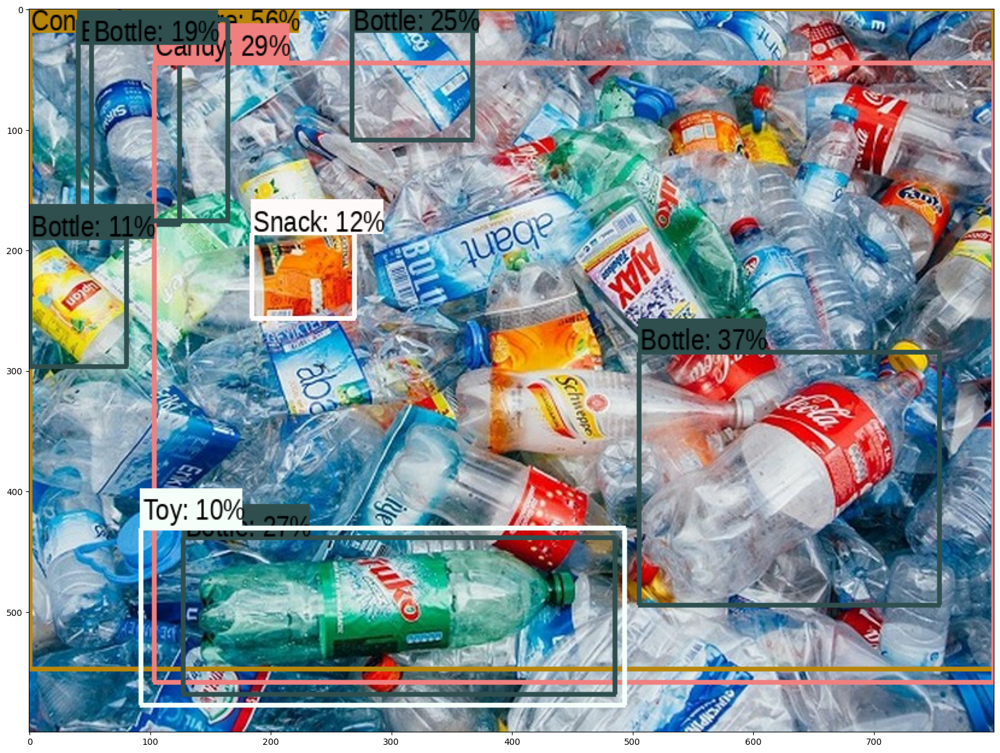

In [ ]:
# 테스트
downloaded_image_path = download_and_resize_image(image_url, 800, 600, True)  # 새로운 크기 지정

run_detector(detector, downloaded_image_path)

In [4]:
# 문제 2-2. 모델 불러오기
import tensorflow as tf
import tensorflow_hub as hub
import time
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

# Class names for SSD Mobilenet (COCO dataset)
class_names = ['background', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
               'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign',
               'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
               'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag',
               'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite',
               'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
               'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana',
               'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table',
               'toilet', 'TV', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
               'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock',
               'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']

# Load image from URL
def load_img_from_url(url):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    return np.array(img)

# Draw bounding boxes on the image
def draw_boxes(image, boxes, class_indices, scores, max_boxes=10, min_score=0.1):
    colors = list(plt.cm.tab10.colors)
    for i in range(min(len(boxes), max_boxes)):
        score = scores[i]
        if np.isscalar(score) and score >= min_score:
            box = boxes[i]
            if isinstance(class_indices[i], (bytes, str)):
                class_name = class_indices[i].decode("ascii") if isinstance(class_indices[i], bytes) else class_indices[i]
            else:
                if int(class_indices[i]) < len(class_names):
                    class_name = class_names[int(class_indices[i])]
                else:
                    class_name = "Unknown"
            color = colors[i % len(colors)]
            y1, x1, y2, x2 = box
            plt.plot([x1, x1, x2, x2, x1], [y1, y2, y2, y1, y1], color=color)
            plt.text(x1, y1, '%s: %.2f' % (class_name, score), color=color)

    return image

# Detector를 실행하는 함수
def run_detector(detector, url):
    img = load_img_from_url(url)
    if detector == detector_ssd:
        converted_img = tf.convert_to_tensor(img, dtype=tf.uint8)[tf.newaxis, ...]
    else:
        converted_img = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

    start_time = time.time()
    result = detector(converted_img)
    end_time = time.time()
    result = {key: value.numpy() for key, value in result.items()}
    print("Found %d objects." % len(result["detection_scores"]))
    print("Inference time: ", end_time - start_time)

    if detector == detector_ssd:
        boxes = result["detection_boxes"][0]
        class_indices = result["detection_classes"][0].astype(int)
        scores = result["detection_scores"][0]
        if len(boxes) != len(scores) or len(boxes) != len(class_indices):
            min_length = min(len(boxes), len(scores), len(class_indices))
            boxes, scores, class_indices = boxes[:min_length], scores[:min_length], class_indices[:min_length]
    else:
        boxes = result["detection_boxes"]
        class_indices = result["detection_class_entities"]
        scores = result["detection_scores"]

    image_with_boxes = draw_boxes(img, boxes, class_indices, scores)
    plt.imshow(image_with_boxes)
    plt.axis('off')
    plt.show()

# Faster RCNN 모델 불러오기
module_handle_faster_rcnn = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"
detector_faster_rcnn = hub.load(module_handle_faster_rcnn).signatures['default']

# SSD Mobilenet 모델 불러오기
module_handle_ssd = "https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2"
detector_ssd = hub.load(module_handle_ssd).signatures['serving_default']

Faster RCNN 모델 테스트:
Found 100 objects.
Inference time:  75.97495746612549


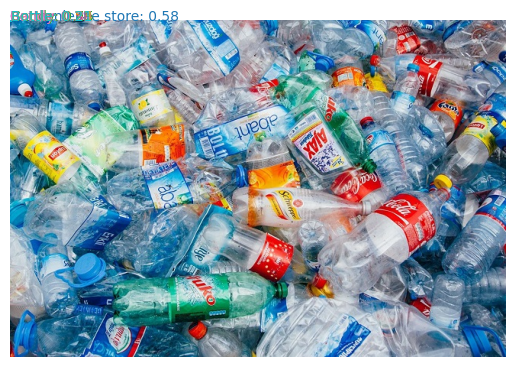


SSD Mobilenet 모델 테스트:
Found 1 objects.
Inference time:  3.186345100402832


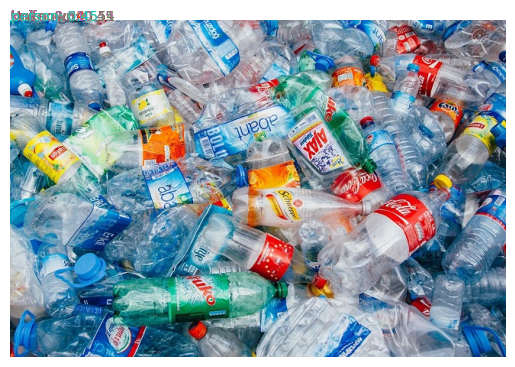

In [5]:
# 문제 2-2. 테스트
# 사용할 이미지 URL 설정
image_url = 'https://weconsumer.or.kr/upload/editor/1620809883_8dC_EC82ACECA7841-1.jpg'

# Faster RCNN 모델로 테스트
print("Faster RCNN 모델 테스트:")
run_detector(detector_faster_rcnn, image_url)

# SSD Mobilenet 모델로 테스트
print("\nSSD Mobilenet 모델 테스트:")
run_detector(detector_ssd, image_url)

In [6]:
# 문제 2-2. 결과 비교
# 결과 비교
print("\n# 결과 비교")
print("1번째 모델인 Faster R-CNN (Inception ResNet V2)은 높은 정확성을 보였습니다.")
print("2번째 모델인 SSD Mobilenet은 상대적으로 빠른 성능을 보여주었습니다.")


# 결과 비교
1번째 모델인 Faster R-CNN (Inception ResNet V2)은 높은 정확성을 보였습니다.
2번째 모델인 SSD Mobilenet은 상대적으로 빠른 성능을 보여주었습니다.
